## 2. 자율주행 보조장치 (1) KITTI 데이터셋

In [33]:
# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

# Helper libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os

import tensorflow_datasets as tfds

import copy
import cv2
from PIL import Image, ImageDraw

In [34]:
# 다운로드에 매우 긴 시간이 소요됩니다. 
import urllib3
urllib3.disable_warnings()

data_dir = os.path.join(os.getenv("HOME"), "aiffel/object_detection/data")

(ds_train, ds_test), ds_info = tfds.load(
    'kitti',
    data_dir=data_dir,
    split=['train', 'test'],
    shuffle_files=True,
    with_info=True,
)

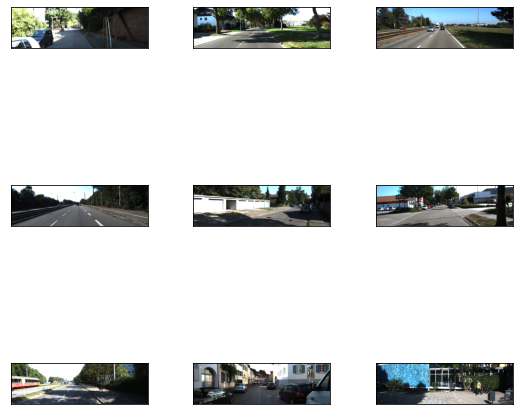

In [35]:
_ = tfds.show_examples(ds_train, ds_info)

In [36]:
ds_info

tfds.core.DatasetInfo(
    name='kitti',
    full_name='kitti/3.2.0',
    description="""
    Kitti contains a suite of vision tasks built using an autonomous driving
    platform. The full benchmark contains many tasks such as stereo, optical flow,
    visual odometry, etc. This dataset contains the object detection dataset,
    including the monocular images and bounding boxes. The dataset contains 7481
    training images annotated with 3D bounding boxes. A full description of the
    annotations can be found in the readme of the object development kit readme on
    the Kitti homepage.
    """,
    homepage='http://www.cvlibs.net/datasets/kitti/',
    data_path='/aiffel/aiffel/object_detection/data/kitti/3.2.0',
    download_size=11.71 GiB,
    dataset_size=5.27 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/file_name': Text(shape=(), dtype=tf.string),
        'objects': Sequence({
            'alpha': tf.float32,
     

## 3. 자율주행 보조장치 (2) 데이터 직접 확인하기

------Example------
['image', 'image/file_name', 'objects']
------objects------
{'alpha': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-2.52], dtype=float32)>, 'bbox': <tf.Tensor: shape=(1, 4), dtype=float32, numpy=array([[0.44957334, 0.6630193 , 0.53458667, 0.73496777]], dtype=float32)>, 'dimensions': <tf.Tensor: shape=(1, 3), dtype=float32, numpy=array([[1.62, 1.72, 4.35]], dtype=float32)>, 'location': <tf.Tensor: shape=(1, 3), dtype=float32, numpy=array([[13.89,  1.74, 39.1 ]], dtype=float32)>, 'occluded': <tf.Tensor: shape=(1,), dtype=int64, numpy=array([1])>, 'rotation_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-2.18], dtype=float32)>, 'truncated': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.], dtype=float32)>, 'type': <tf.Tensor: shape=(1,), dtype=int64, numpy=array([0])>}


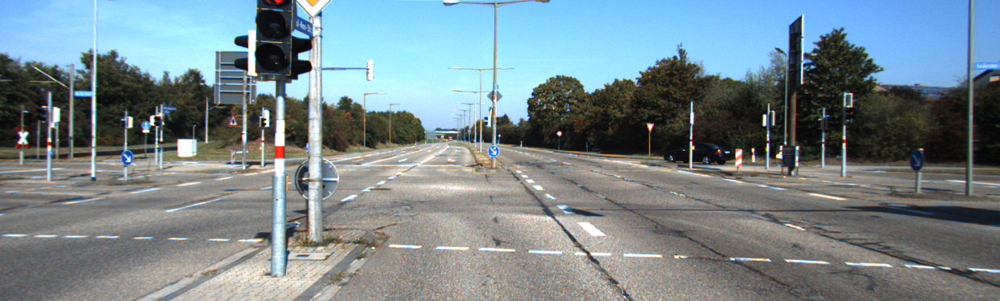

In [37]:
sample = ds_train.take(1)

for example in sample:  
    print('------Example------')
    print(list(example.keys())) # example is `{'image': tf.Tensor, 'label': tf.Tensor}`
    image = example["image"]
    filename = example["image/file_name"].numpy().decode('utf-8')
    objects = example["objects"]

print('------objects------')
print(objects)

img = Image.fromarray(image.numpy())
img

width: 1242 height: 375
(1, 4)
[823.47    206.41    912.82996 174.53   ]
<PIL.Image.Image image mode=RGB size=1242x375 at 0x7F61F661F790>


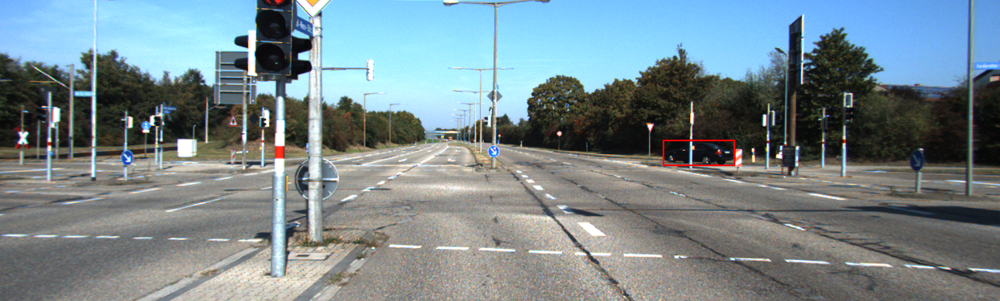

In [38]:
def visualize_bbox(input_image, object_bbox):
    input_image = copy.deepcopy(input_image)
    draw = ImageDraw.Draw(input_image)
    
    # 바운딩 박스 좌표(x_min, x_max, y_min, y_max)구하기
    width, height = img.size
    print('width:', width, 'height:', height)
    print(object_bbox.shape)
    x_min = object_bbox[:,1] * width
    x_max = object_bbox[:,3] * width
    y_min = height - object_bbox[:,0] * height
    y_max = height - object_bbox[:,2] * height
    
    # 바운딩 박스 그리기
    rects = np.stack([x_min, y_min, x_max, y_max], axis = 1)
    for _rect in rects:
        print(_rect)
        draw.rectangle(_rect, outline=(255,0,0), width=2)
    
    print(input_image)
    return input_image

visualize_bbox(img, objects['bbox'].numpy())

## 4. RetinaNet
1-stage detector 모델인 YOLO와 SSD는 속도는 빠르지만 성능이 낮다. RetinaNet에서는 이를 개선하기 위해 focal loss와 FPN을 사용한다.

### Focal Loss
Focal Loss는 기존의 1-stage detection모델들이 물체 전경과 배경을 담고 있는 그리드에 대해 한 번에 학습함으로써 생기는 클래스 간의 불균형을 해결하고자 도입되었다.
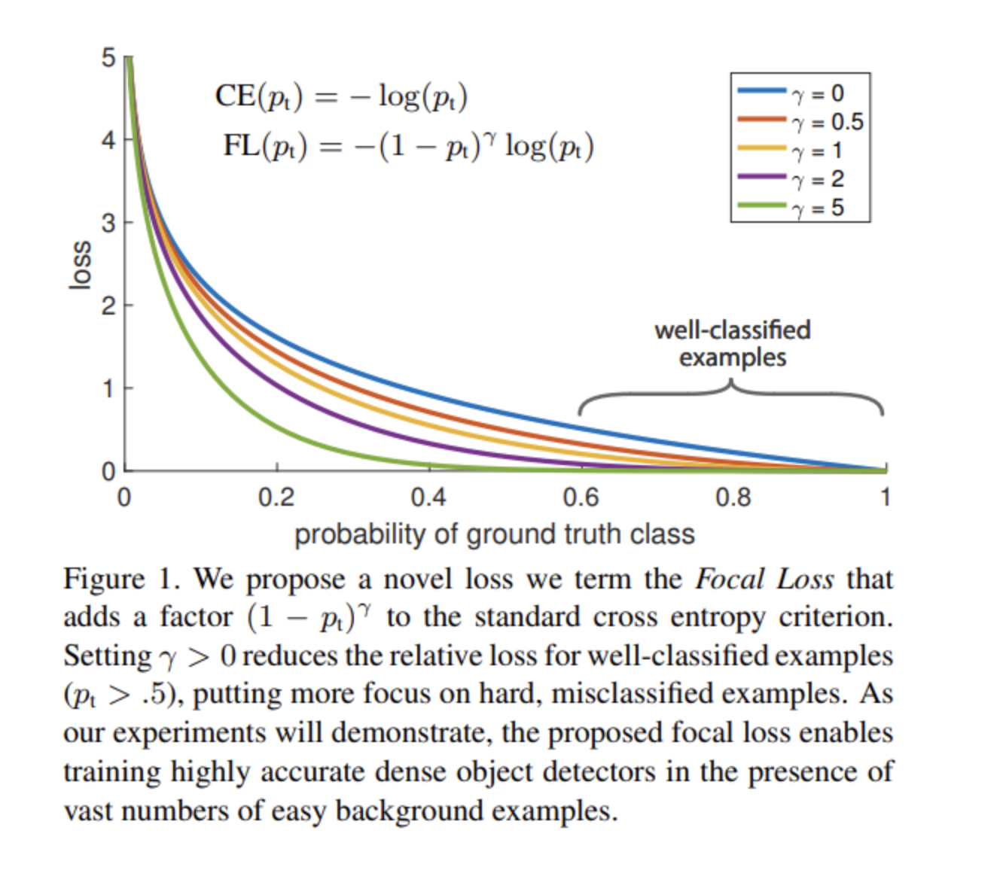
Focal loss는 교차 엔트로피 앞 단에 modulating factor를 붙여주었다.
교차 엔트로피의 개형을 보면 ground truth class에 대한 확률이 높으면 잘 분류 된 것으로 판단하므로 손실이 줄어드는 것을 볼 수 있다. 하지만 확률이 1에 매우 가깝지 않은 이상 상당이 큰 손실로 이어진다.
대부분의 이미징서 물체보다 배경이 많으므로 물체 검출 모델을 학습시키는 과정에서 문제가 발생할 수 있다. 이렇게 너무 많은 배경 class에 압도되지 않도록 modulating factor로 손실을 조절한다.

### FPN(Feature Pyramid Network)
FPN은 특성을 피라미드처럼 쌓아서 사용하는 방식이다. 백본의 여러 레이어를 한꺼번에 쓰겠다는 것인데, SSD가 각 레이어의 특성 맵에서 다양한 크기에 대한 결과를 얻는 방식이라면 RetinaNet에서는 receptive field가 넓은 뒷쪽의 특성 맵을 upsampling(확대)하여 앞단의 특성 맵과 더해서 사용한다.
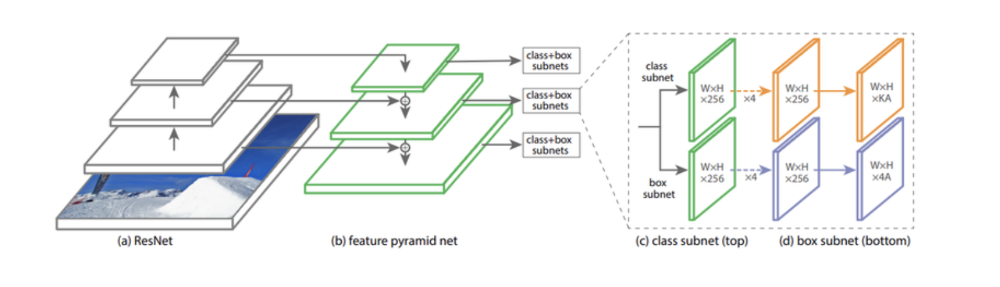

## 5. Keras-retinanet 실습 (1) 데이터 포맷 변경

In [7]:
import os
data_dir = os.getenv('HOME') + '/aiffel/object_detection/data'
img_dir = data_dir + '/kitti_images'
train_csv_path = data_dir + '/kitti_train.csv'

In [14]:
# KITTI 데이터셋 ds_train을 파싱해서 dataframe으로 변환
def parse_dataset(dataset, img_dir, total=0):
    if not os.path.exists(img_dir):
        os.mkdir(img_dir)
    # 기존의 class를 차와 사람으로 나눔
    type_class_map = {
        0: "car",
        1: "car",
        2: "car",
        3: "person",
        4: "person",
        5: "person",
    }
    # keras retinanet을 학습하기 위한 dataset을 csv로 parsing하기 위해서
    # 필요한 column을 가진 pandas.DataFrame을 생성
    df = pd.DataFrame(columns=["img_path", "x1", "y1", "x2", "y2", "class_name"])
    for item in tqdm(dataset, total=total):
        filename = item['image/file_name'].numpy().decode('utf-8')
        img_path = os.path.join(img_dir, filename)
        
        img = Image.fromarray(item['image'].numpy())
        img.save(img_path)
        object_bbox = item['objects']['bbox']
        object_type = item['objects']['type'].numpy()
        width, height = img.size
        
        # tf.dataset의 bbox좌표가 0과 1사이로 normalize된 좌표이므로 이를 pixel좌표로 변환
        x_min = object_bbox[:, 1] * width
        x_max = object_bbox[:, 3] * width
        y_min = height - object_bbox[:, 2] * height
        y_max = height - object_bbox[:, 0] * height
        
        # 한 이미지에 있는 여러 Object들을 한 줄씩 pandas.DataFrame에 append
        rects = np.stack([x_min, y_min, x_max, y_max], axis=1).astype(np.int)
        for i, _rect in enumerate(rects):
            _type = object_type[i]
            if _type not in type_class_map.keys():
                continue
            df = df.append({
                "img_path" : img_path,
                "x1" : _rect[0],
                "y1" : _rect[1],
                "x2" : _rect[2],
                "y2" : _rect[3],
                "class_name" : type_class_map[_type]
            }, ignore_index=True)
            
    return df

df_train = parse_dataset(ds_train, img_dir, total=ds_info.splits['train'].num_examples)
df_train.to_csv(train_csv_path, sep=',', index=False, header=False)

100%|██████████| 6347/6347 [24:39<00:00,  4.29it/s]


In [15]:
test_csv_path = data_dir + '/kitti_test.csv'

df_test = parse_dataset(ds_test, img_dir, total=ds_info.splits['test'].num_examples)
df_test.to_csv(test_csv_path, sep=',', index=False, header=False)

100%|██████████| 711/711 [02:51<00:00,  4.14it/s]


### 클래스 맵핑
데이터셋에서 클래스는 문자열(string)으로 표시되지만, 모델에게 데이터를 알려줄 때에는 숫자를 사용해 클래스를 표시해야 한다. 이때 모두 어떤 클래스가 있고 각 클래스가 어떤 인덱스(index)에 맵핑(mapping)될지 미리 정하고 저장해 두어야 학습을 한 후 추론(inference)을 할 때에도 숫자 인덱스로 나온 정보를 클래스 이름으로 바꾸어 해석할 수 있다.

In [8]:
class_txt_path = data_dir + '/classes.txt'

def save_class_format(path):
    class_type_map = {
        "car" : 0,
        "person" : 1
    }
    with open(path, mode='w', encoding='utf-8') as f:
        for k, v in class_type_map.items():
            f.write(f"{k},{v}\n")
    print('Done')
    
save_class_format(class_txt_path)            

Done


## 6. keras-retinanet 실습 (2) 셋팅

In [21]:
# RetinaNet 훈련이 시작됩니다!! 10epoch 훈련에 1시간 이상 소요될 수 있습니다. 
!cd ~/aiffel/object_detection && python keras-retinanet/keras_retinanet/bin/train.py --gpu 0 --multiprocessing --workers 4 --batch-size 2 --epochs 10 --steps 195 csv data/kitti_train.csv data/classes.txt
print("Done")

2021-12-30 04:54:31.582125: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-12-30 04:54:33.463558: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-12-30 04:54:33.464494: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-12-30 04:54:33.488362: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-30 04:54:33.489247: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:00:1e.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.8755GHz coreCount: 13 deviceMemorySize: 11.17GiB deviceMemoryBandwidth: 223.96GiB/s
2021-12-30 04:54:33.489287: I tensorflow/stream_executor/platform/default/dso_lo

res2b_branch2b (Conv2D)         (None, None, None, 6 36864       padding2b_branch2b[0][0]         
__________________________________________________________________________________________________
bn2b_branch2b (BatchNormalizati (None, None, None, 6 256         res2b_branch2b[0][0]             
__________________________________________________________________________________________________
res2b_branch2b_relu (Activation (None, None, None, 6 0           bn2b_branch2b[0][0]              
__________________________________________________________________________________________________
res2b_branch2c (Conv2D)         (None, None, None, 2 16384       res2b_branch2b_relu[0][0]        
__________________________________________________________________________________________________
bn2b_branch2c (BatchNormalizati (None, None, None, 2 1024        res2b_branch2c[0][0]             
__________________________________________________________________________________________________
res2b (Add

2021-12-30 04:54:39.604564: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2021-12-30 04:54:39.605247: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 2300075000 Hz
Epoch 1/10
2021-12-30 04:54:49.386893: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.8
2021-12-30 04:54:50.817494: W tensorflow/stream_executor/gpu/asm_compiler.cc:63] Running ptxas --version returned 256
2021-12-30 04:54:50.852829: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: ptxas exited with non-zero error code 256, output: 
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2021-12-30 04:54:51.438295: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2021-12-30 04:54:51.656945: I tensor

In [22]:
!cd ~/aiffel/object_detection && python keras-retinanet/keras_retinanet/bin/convert_model.py snapshots/resnet50_csv_10.h5 snapshots/resnet50_csv_10_infer.h5
print("Done")

2021-12-30 05:33:35.214329: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-12-30 05:33:36.948677: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-12-30 05:33:36.949625: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-12-30 05:33:36.975326: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-30 05:33:36.976086: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:00:1e.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.8755GHz coreCount: 13 deviceMemorySize: 11.17GiB deviceMemoryBandwidth: 223.96GiB/s
2021-12-30 05:33:36.976126: I tensorflow/stream_executor/platform/default/dso_lo

## 7. keras-retinanet 실습 (3) 시각화

In [40]:
%matplotlib inline

# automatically reload modules when they have changed
%load_ext autoreload
%autoreload 2

# import keras
import keras

# import keras_retinanet
from keras_retinanet import models
from keras_retinanet.models import load_model
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color
from keras_retinanet.utils.gpu import setup_gpu

# import miscellaneous modules
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import time

gpu = '0'
setup_gpu(gpu)
    
dir_path = os.getenv('HOME') + '/aiffel/object_detection/'
model_path = os.path.join(dir_path, 'snapshots', 'resnet50_csv_10_infer.h5')

model = load_model(model_path, backbone_name='resnet50')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
1 Physical GPUs, 1 Logical GPUs


In [20]:
import os
img_path = os.getenv('HOME')+'/aiffel/object_detection/test_set/go_1.png'

# inference_on_image 함수를 구현해 주세요.
def inference_on_image(model, img_path, visualize=True):
    image = read_image_bgr(img_path)

    # copy to draw on
    draw = image.copy()
    draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

    color_map = {
        0: (0, 0, 255), # blue
        1: (255, 0, 0) # red
    }

    # preprocess image for network
    image = preprocess_image(image)
    image, scale = resize_image(image)

    # process image
    boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))

    # correct for image scale
    boxes /= scale

    # display images
    if  visualize:
        for box, score, label in zip(boxes[0], scores[0], labels[0]):
            print(box)
            if score < 0.5:
                break
            b = box.astype(int)
            draw_box(draw, b, color=color_map[label])

            caption = "{:.3f}".format(score)
            draw_caption(draw, b, caption)

        plt.figure(figsize=(15, 15))
        plt.axis('off')
        plt.imshow(draw)
        plt.show()            

[187.4842  137.9086  359.37726 234.8202 ]
[590.8275  174.54413 625.1199  205.86005]
[375.18463 184.08904 417.17996 209.38753]
[531.0165  162.62013 563.81384 190.62581]
[440.25754 175.91623 473.7988  199.25896]
[684.6221  146.38557 734.8042  192.6584 ]


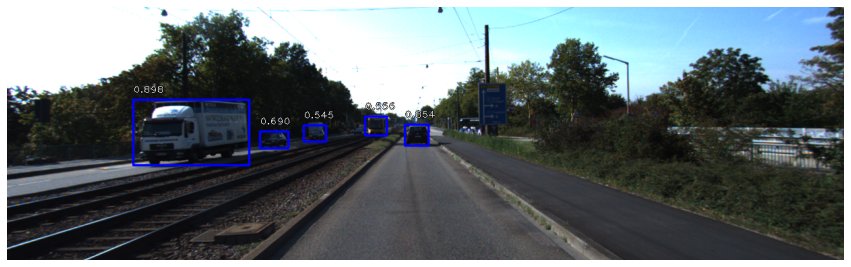

In [11]:
inference_on_image(model, img_path)

[772.3681  143.61517 850.81305 307.01364]
[770.9022  141.32614 848.90826 305.8174 ]


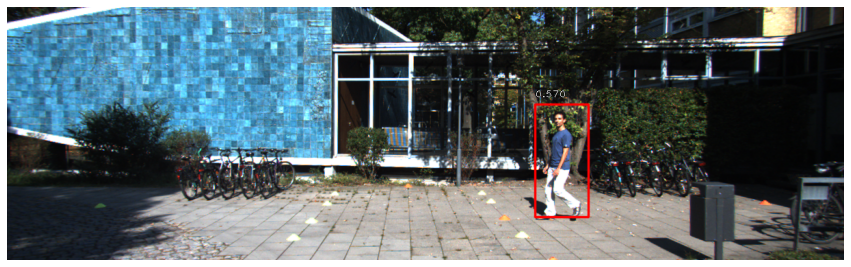

In [12]:
img_path = os.getenv('HOME')+'/aiffel/object_detection/test_set/stop_1.png'
inference_on_image(model, img_path)

# 프로젝트: 자율주행 보조 시스템 만들기
## 1. 자율주행 시스템 만들기
위에서 만든 모델을 통해 아래 조건 만족하는 함수
- 입력으로 이미지 경로 받기
- 정지조건에 맞는 경우 "Stop" 아닌 경우 "Go"를 반환
- 조건은 다음과 같다.
1. 사람이 한 명 이상 있는 경우  
2. 차량의 크기가 300px 이상인 경우 

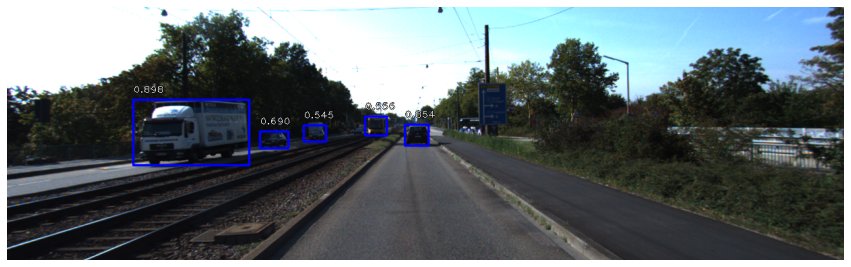

Go


In [45]:
import os
img_path = os.getenv('HOME')+'/aiffel/object_detection/test_set/go_1.png'

def self_drive_assist(img_path, size_limit=300):
 
    image = read_image_bgr(img_path)

    # copy to draw on
    draw = image.copy()
    draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

    color_map = {
        0: (0, 0, 255), # blue
        1: (255, 0, 0) # red
    }

    # preprocess image for network
    image = preprocess_image(image)
    image, scale = resize_image(image)

    # process image
    boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))

    # correct for image scale
    boxes /= scale
    
    for box, score, label in zip(boxes[0], scores[0], labels[0]):
        if score < 0.5:
            break
        b = box.astype(int)
        draw_box(draw, b, color=color_map[label])

        caption = "{:.3f}".format(score)
        draw_caption(draw, b, caption)
            
        if label==1:
            plt.figure(figsize=(15, 15))
            plt.axis('off')
            plt.imshow(draw)
            plt.show()             
            return "Stop"
        
        if (box[3]-box[1])>=300 or (box[2]-box[0])>=300:            
            plt.figure(figsize=(15, 15))
            plt.axis('off')
            plt.imshow(draw)
            plt.show()
            return "Stop"
        
    plt.figure(figsize=(15, 15))
    plt.axis('off')
    plt.imshow(draw)
    plt.show()  
    
    return "Go"

print(self_drive_assist(img_path))

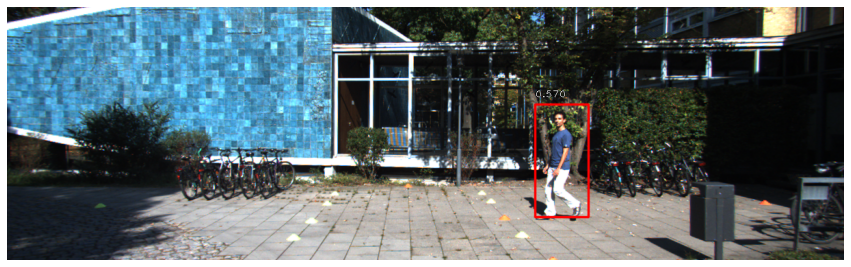

Stop


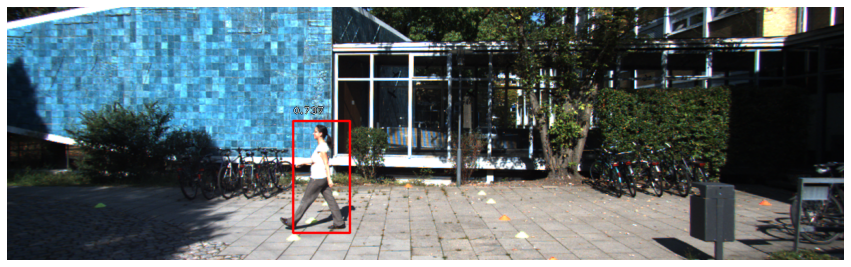

Stop


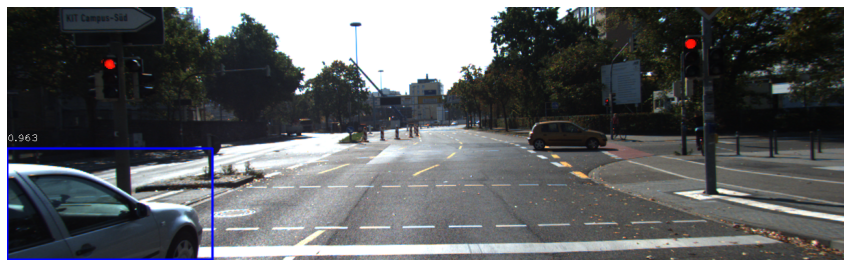

Stop


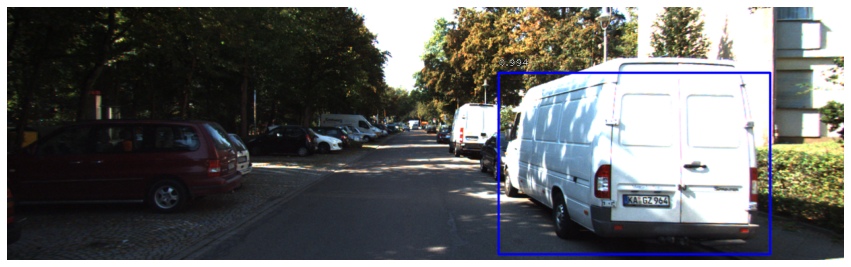

Stop


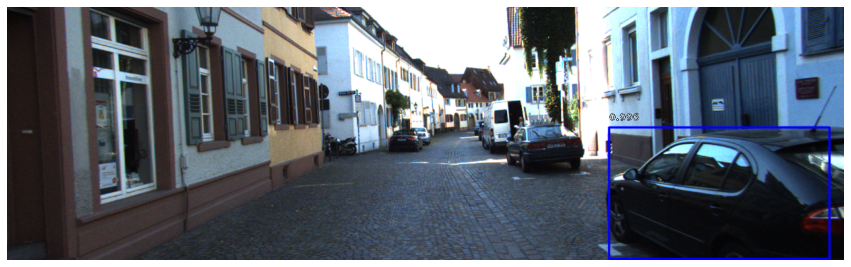

Stop


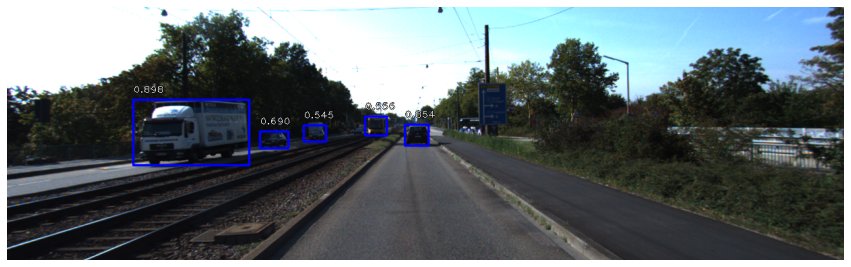

Go


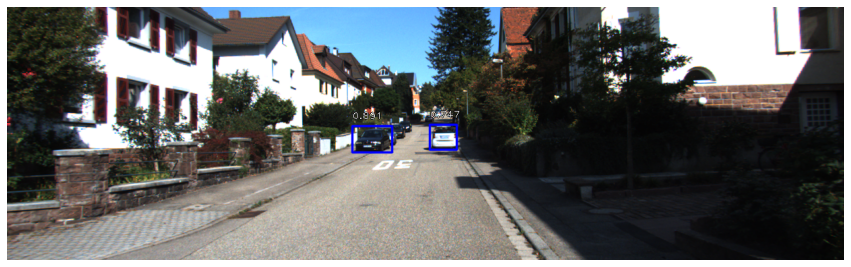

Go


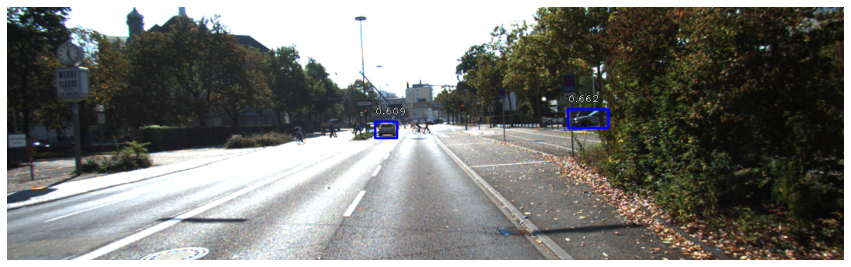

Go


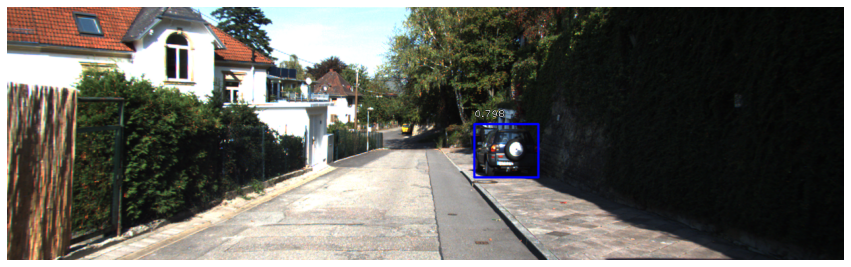

Go


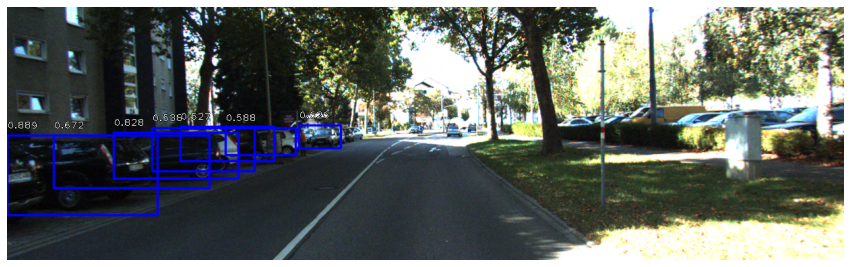

Go
100점입니다.


In [47]:
import os

def test_system(func):
    work_dir = os.getenv('HOME')+'/aiffel/object_detection'
    score = 0
    test_set=[
        ("test_set/stop_1.png", "Stop"),
        ("test_set/stop_2.png", "Stop"),
        ("test_set/stop_3.png", "Stop"),
        ("test_set/stop_4.png", "Stop"),
        ("test_set/stop_5.png", "Stop"),
        ("test_set/go_1.png", "Go"),
        ("test_set/go_2.png", "Go"),
        ("test_set/go_3.png", "Go"),
        ("test_set/go_4.png", "Go"),
        ("test_set/go_5.png", "Go"),
    ]
    
    for image_file, answer in test_set:
        image_path = work_dir + '/' + image_file
        pred = func(image_path)
        print(pred)
        if pred == answer:
            score += 10
    print(f"{score}점입니다.")

test_system(self_drive_assist)

## 회고
### 1. 오류
- ModuleNotFoundError: No module named 'progressbar' 오류가 떠서 pip install progressbar를 해줌
- No module named 'keras_resnet' 오류가 떠서 pip install keras-resnet를 해줌
- No module named 'keras_retinanet'가 떠서 pip install keras_retinanet 해줌

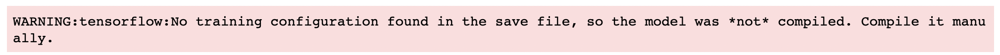
- 구성 메서드를 덮어쓰지않고 SavedModel 형식에서 사용자 정의 레이어를 로딩할 때 발생하는 현상이라고 하는데 이해가 가지 않는다.

### 2. 요약
자율주행 데이터 셋인 키티를 다운받고, retinanet으로 모델을 학습, 자율주행 보조 시스템(사람이 있거나, 차가 가까이 있으면 멈춤)을 만들었다.

### 3. 더 개선해야할 점
- self_drive_assist 함수에서 사진을 시각화하면 좋을 것 같아서 추가했는데, 지저분하게 3번이나 반복해서 사용했다. 간단하게 만들면 좋을 것 같다.
- box[3]-box[1]을 하면 여러 박스들의 세로 사이즈가 나올텐데, 한꺼번에 300이상일때를 처리해도 되는 건지 애매했지만 그냥 사용했는데 됐다. 구체적인 데이터 처리 방식을 알아야 될 것 같다.

처음 